# Objectives:

Investigate coverage (total number of annotations) / (total number of spots).

The declumping algorithm seems to work well when cluster size is bimodal but cluster size is more unimodal in these smFISH annotations. Coverage was not high enough (total number of annotations) / (total number of spots) may not be high enough; in this case, there wouldn't be clear division between types of clusters because there aren't enough annotations in many of the clusters. 

# Numbers:

| Width | Inverted? | # Spots detected | # Spots total | Detection rate | Avg # annotations per spot | Avg # annotations per detected spot |
|------|------|------|------|------|------|------|
|300|no|127|145|0.88|11.74|13.41|
|500|no|173|230|0.75|11.14|14.82|
|700|no|124|268|0.46|6.79|14.67|
|300|yes|124|145|0.86|12.19|14.26|
|500|yes|203|230|0.88|12.68|14.36|
|700|yes|150|268|0.56|7.85|14.03|

# Takeaways:

On the scatter plots that show detected spots in green and undetected spots in magenta, it’s apparent that undetected spots are usually in denser regions. They tend to be lighter than nearby spots, so I have two hypotheses regarding why these spots are undetected in denser regions. 

1. Since these lighter spots next to darker spots, workers are less likely to think they’re valid spots.
2. Workers go for the darker spots first and the markers left by the worker’s cursor obscure the lighter spots neighboring.

Were I to hazard a guess, I’d think the second phenomenon is a bigger issue, and may be the main reason zooming in on denser regions is necessary.

I was unsurprised that clumpy clusters seem to occur more frequently in denser regions, and occur less frequently in the largest images perhaps because workers are detecting fewer spots in general.

# Next steps:

I think our most immediate goal is proof of concept for cluster-size-thresholding-and-declumping with the assumption that spots are sufficiently sparse, so I think as a next step it would be helpful to get annotations for crops of the biggest (worst-performing) image.

Perhaps we might also test on other real images (maximum intensity projections, inverted and not inverted).

# The plots in this notebook:

For each image, the following figures are shown:
- The smFISH image with no annotations.
- The smFISH image with all annotations colored by worker.
- The smFISH image with all annotations colored by worker and all clusters found by Affinity Propagation.
- Histogram sorting each cluster by the number of unique contributors.
- The smFISH image with small clusters omitted. Annotations are colored by cluster membership.
- The smFISH image with detected reference spots in green and undetected reference spots in magenta. Centroids are cyan unfilled circles and centroids of clumpy clusters are orange unfilled circles.

I went ahead and generated these visualizations for all the images in the same notebook so that I could quickly scroll up and down to see if my observations for any given image generalize to other images. I tried to organize all these plots a little bit so they look less like a pile of plots, and you can navigate to different images by searching for the image name (e.g. ISP_293T_TFRC_InSituPrep_20180712_1_MMStack_Pos0_300.png).

In [1]:
from SpotAnnotationAnalysis import SpotAnnotationAnalysis
from BaseAnnotation import BaseAnnotation
from QuantiusAnnotation import QuantiusAnnotation
import math
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import matplotlib.patches as mpatches
import matplotlib.image as mpimg
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.neighbors import KDTree

from skimage import filters

%matplotlib inline

worker_marker_size = 8
cluster_marker_size = 40
ref_marker_size = 30
bigger_window_size = True
img_height = 450
show_correctness_workers = False
show_correctness_clusters = False
show_NN_inc = False
show_ref_points = True
correctness_threshold = 5
show_possible_clumps = False
show_ref_points = False
clustering_params = ['AffinityPropagation', -350]

In [2]:
csv_filepath = '/Users/jenny.vo-phamhi/Documents/FISH-annotation/Annotation/smFISH_test/700.csv'
ref_df = pd.read_csv(csv_filepath)
ref_points = ref_df.loc[:,['col', 'row']].as_matrix()
ref_x = ref_points[:,0]
ref_y = ref_points[:,1]
ref_x = [x-2 for x in ref_x]
ref_y = [y-2 for y in ref_y]

for i in range(len(ref_points)):
    point = ref_points[i]
    new_point = [point[0], 450-point[1]]
    ref_points[i] = new_point

------------- C2-ISP_293T_TFRC_InSituPrep_20180712_1_MMStack_Pos0_300.png -------------


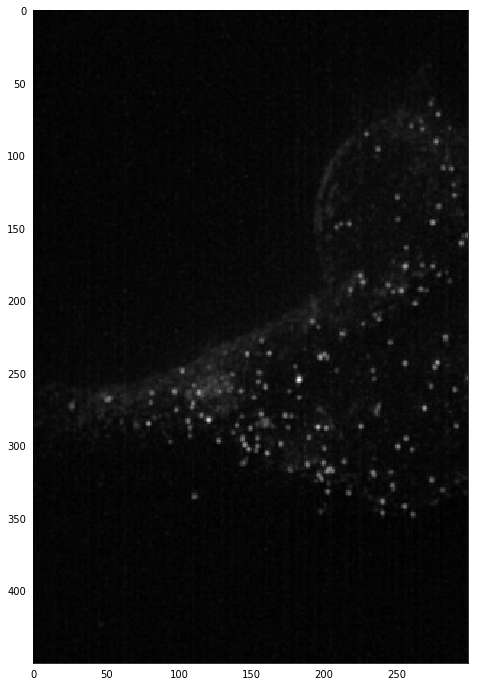

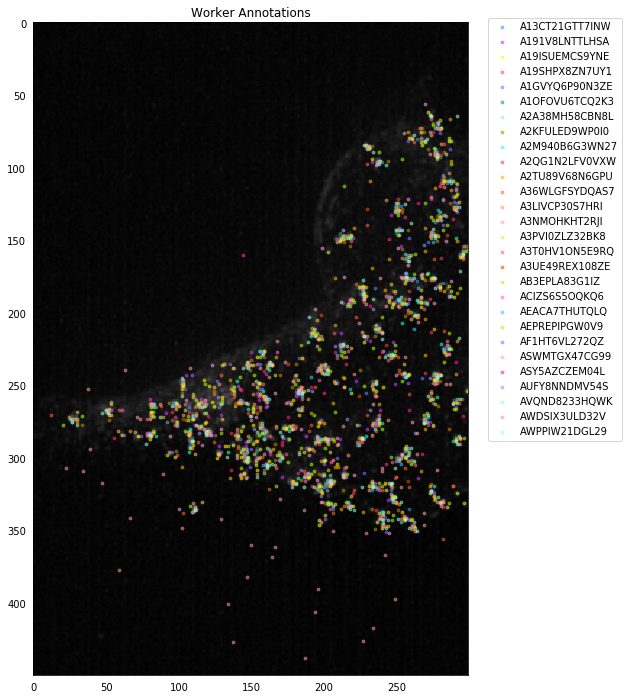

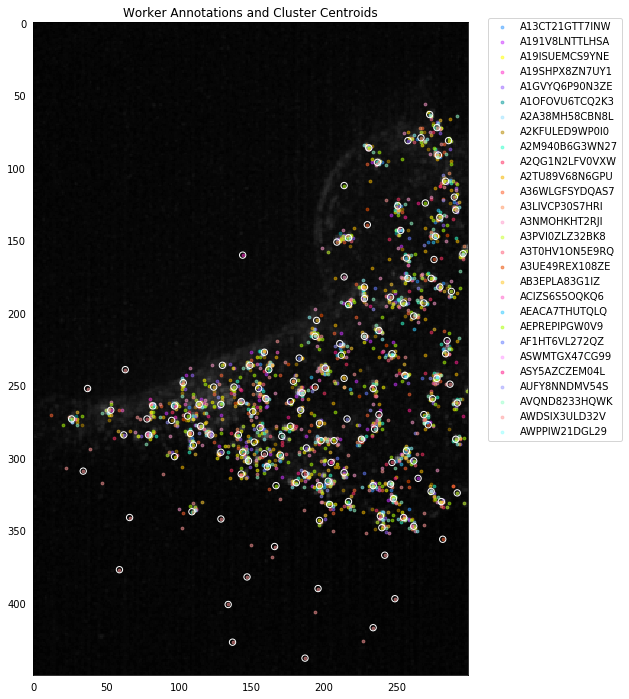

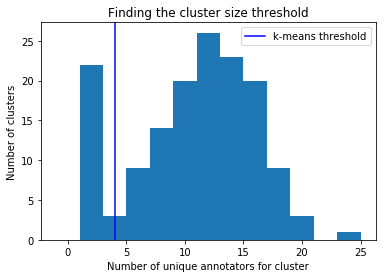

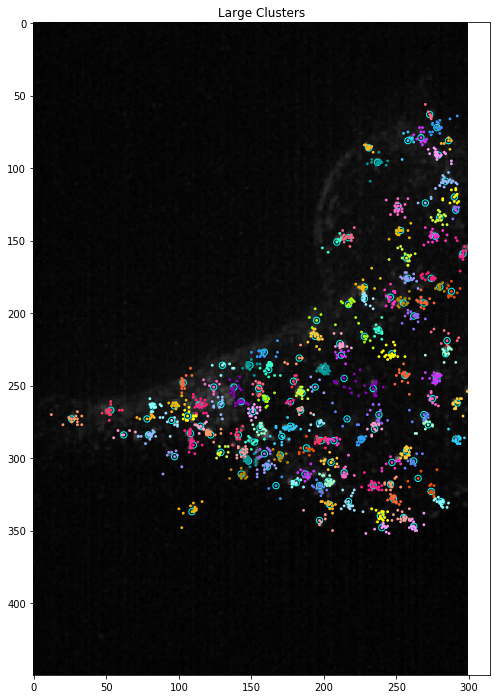

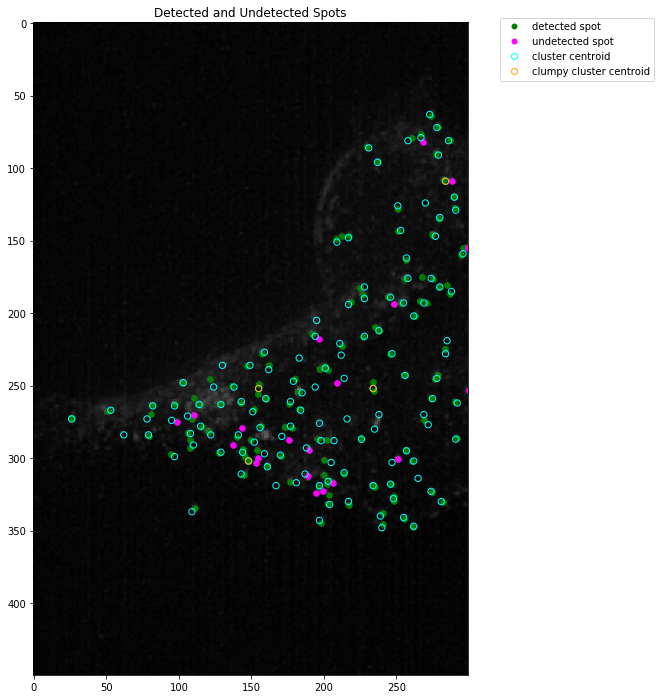

------------- C2-ISP_293T_TFRC_InSituPrep_20180712_1_MMStack_Pos0_500.png -------------


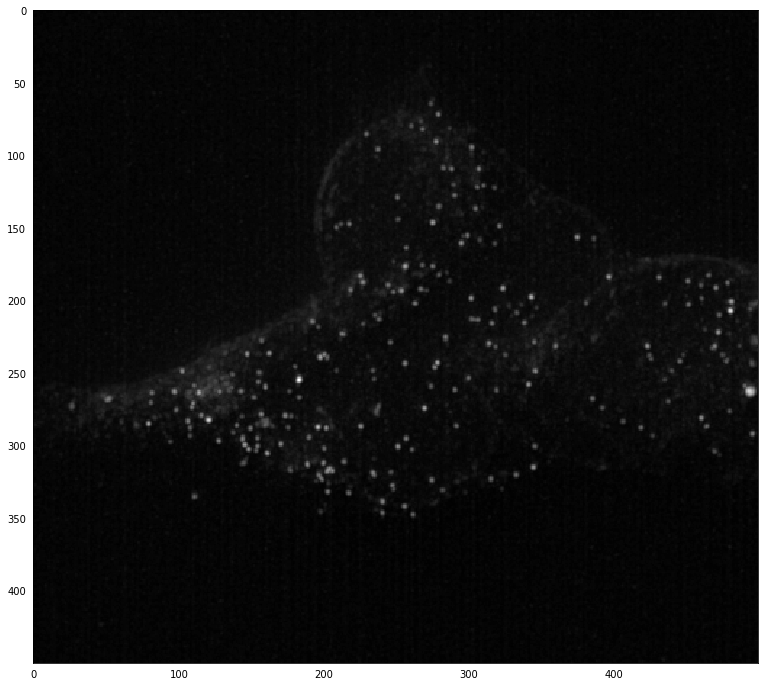

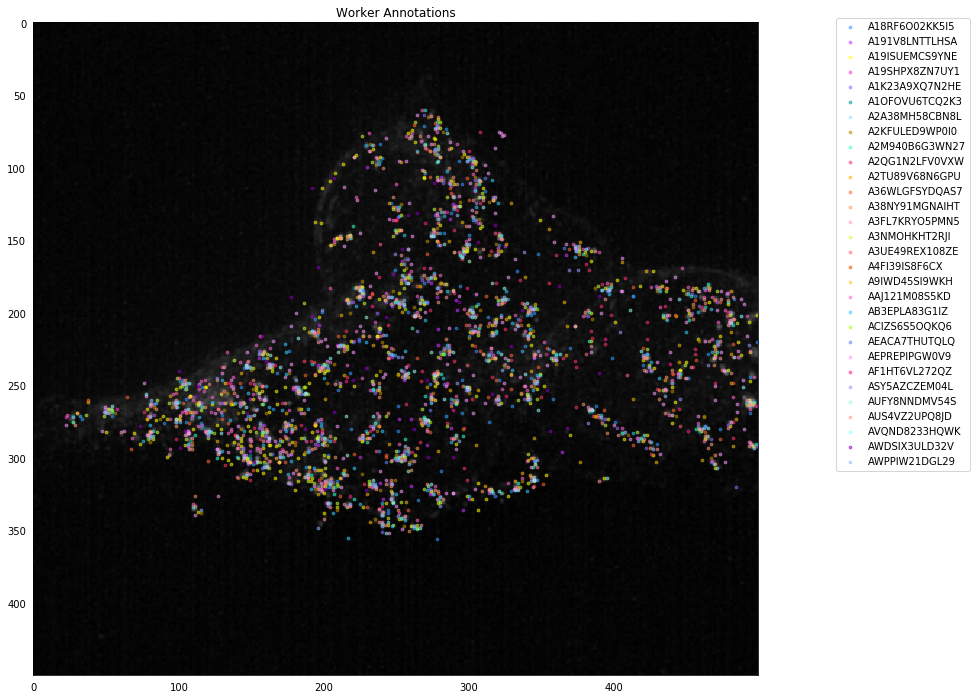

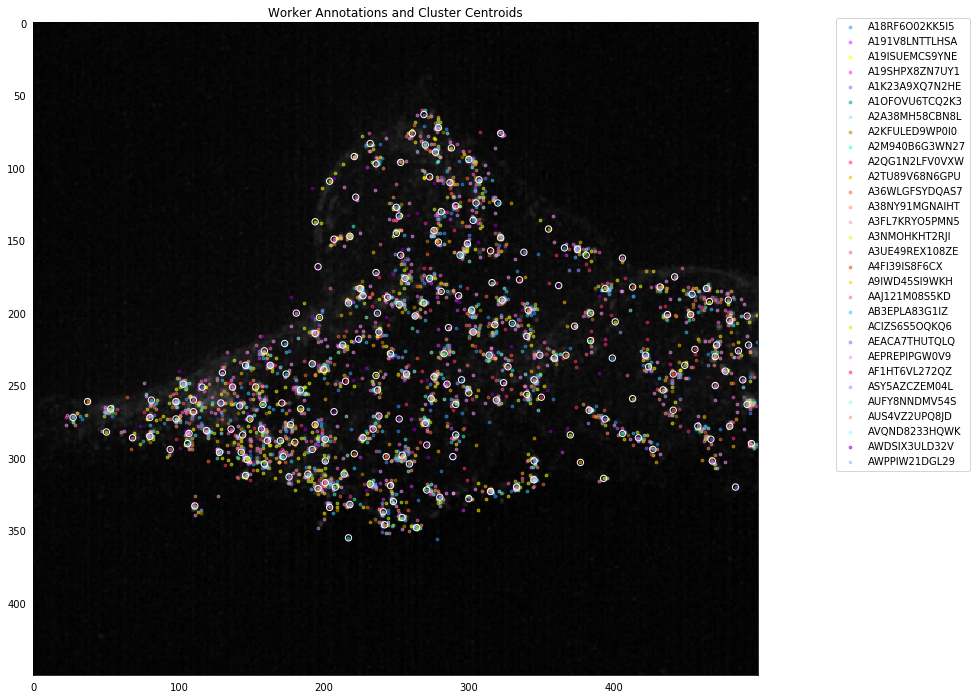

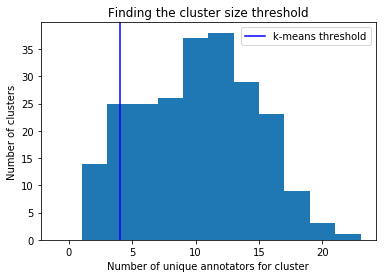

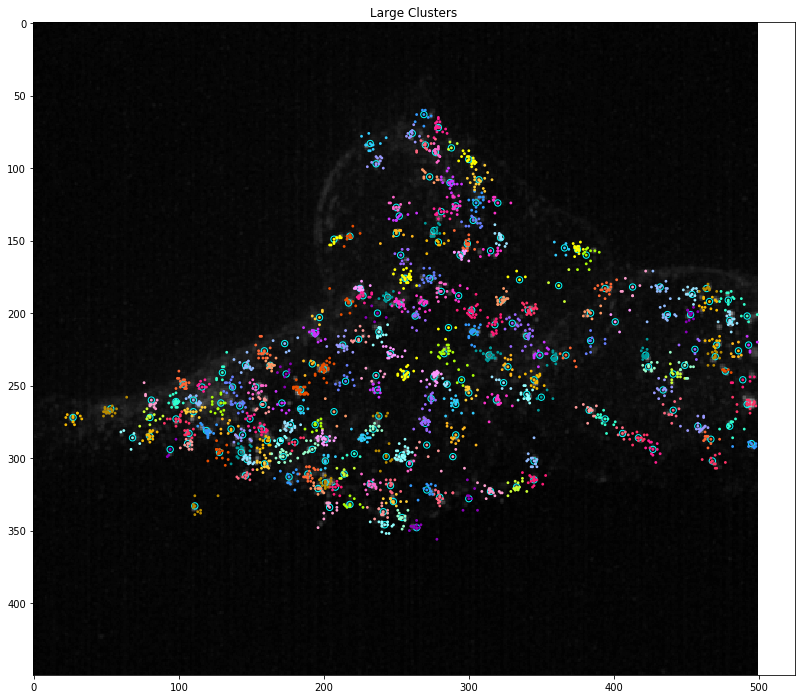

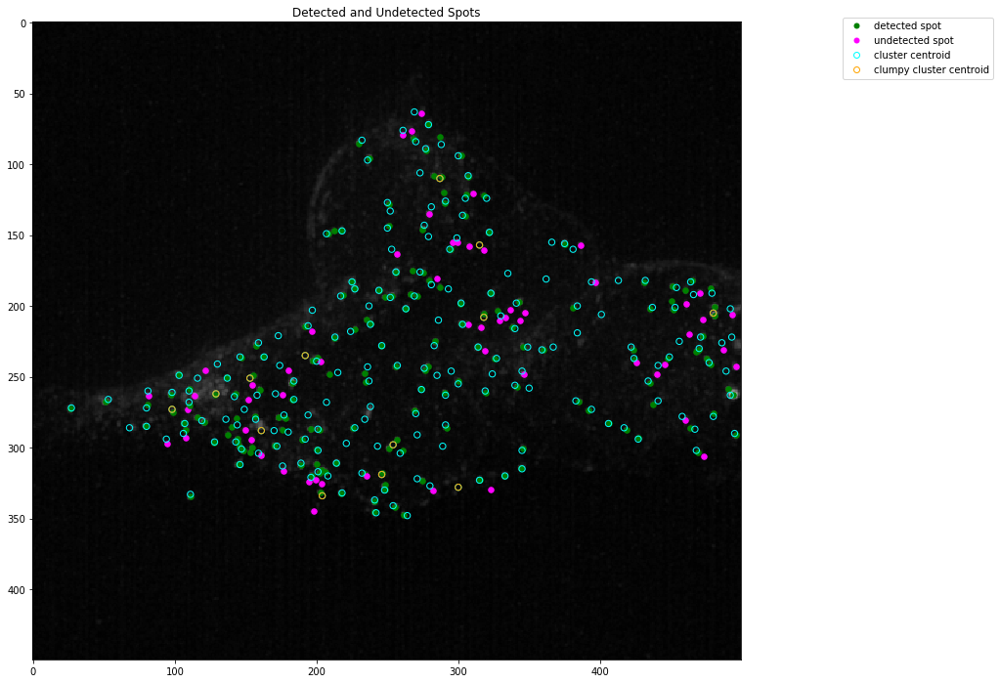

------------- C2-ISP_293T_TFRC_InSituPrep_20180712_1_MMStack_Pos0_700.png -------------


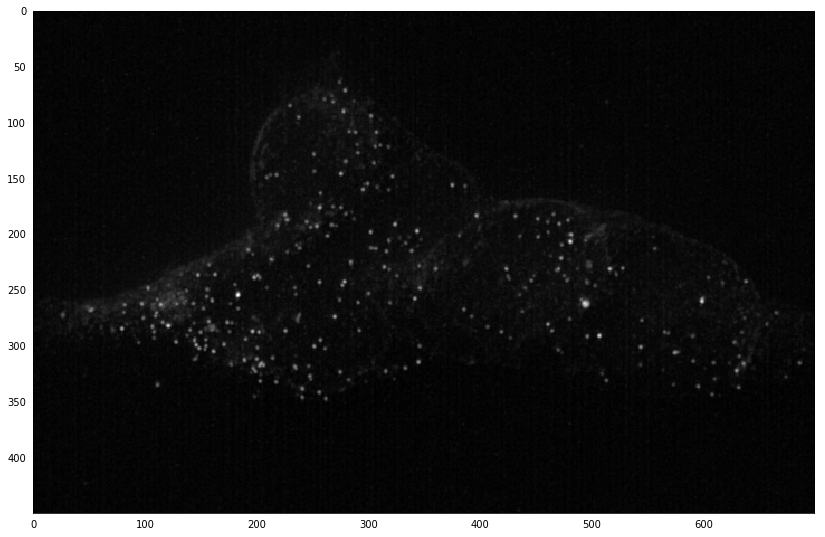

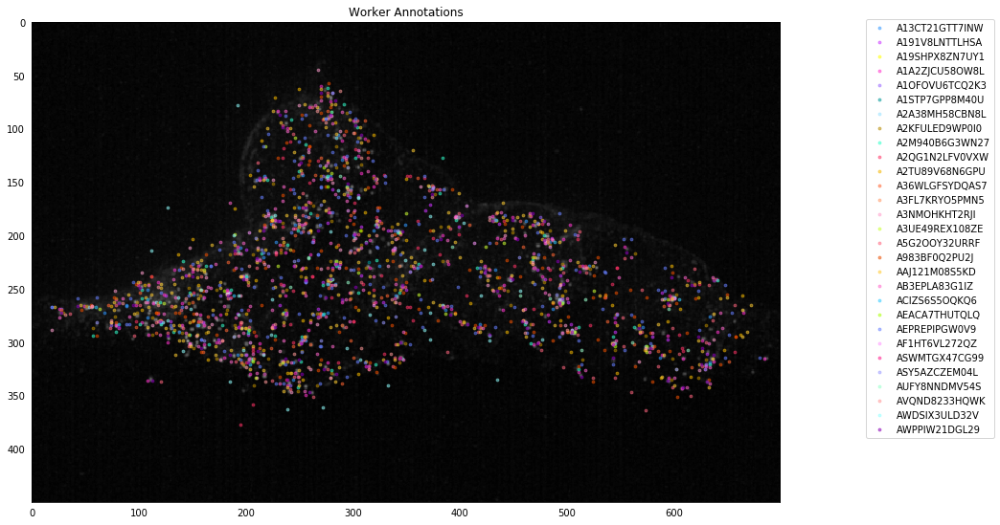

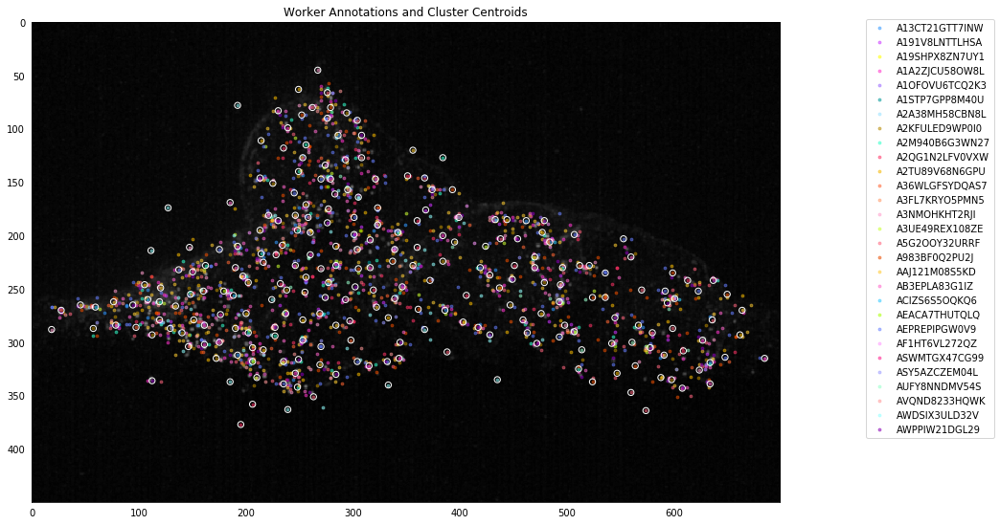

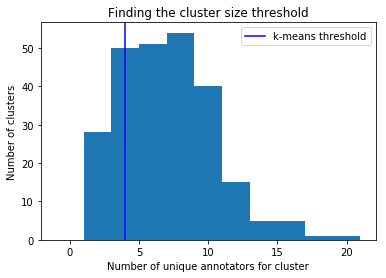

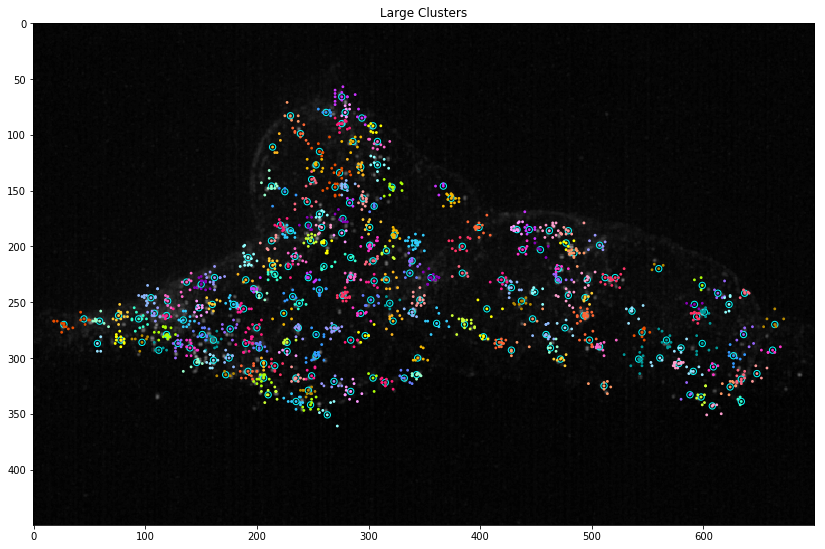

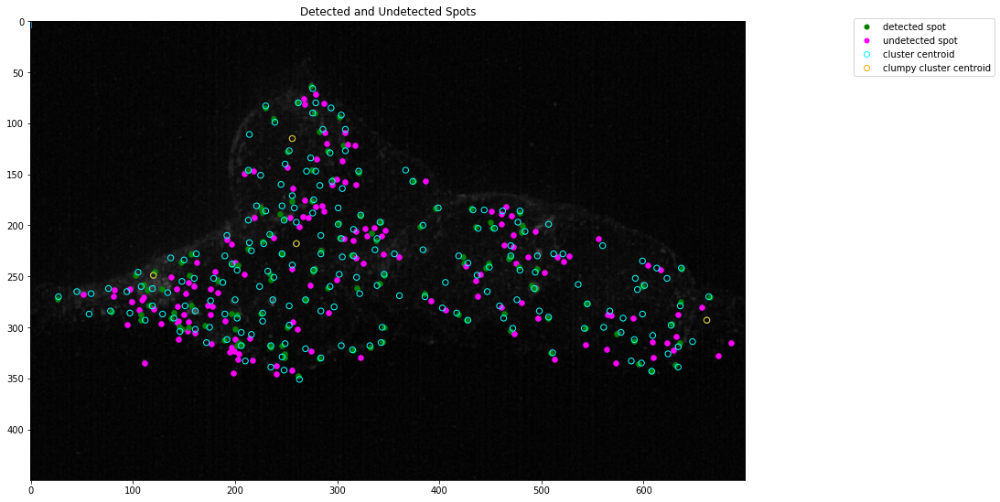

------------- C2-ISP_293T_TFRC_InSituPrep_20180712_1_MMStack_Pos0_300_inv.png -------------


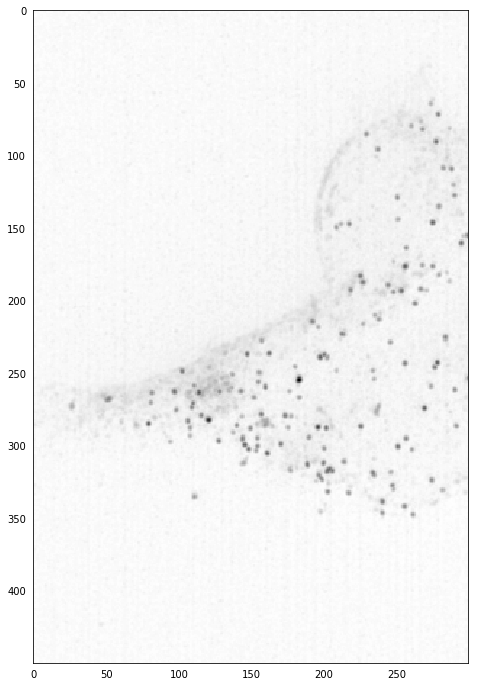

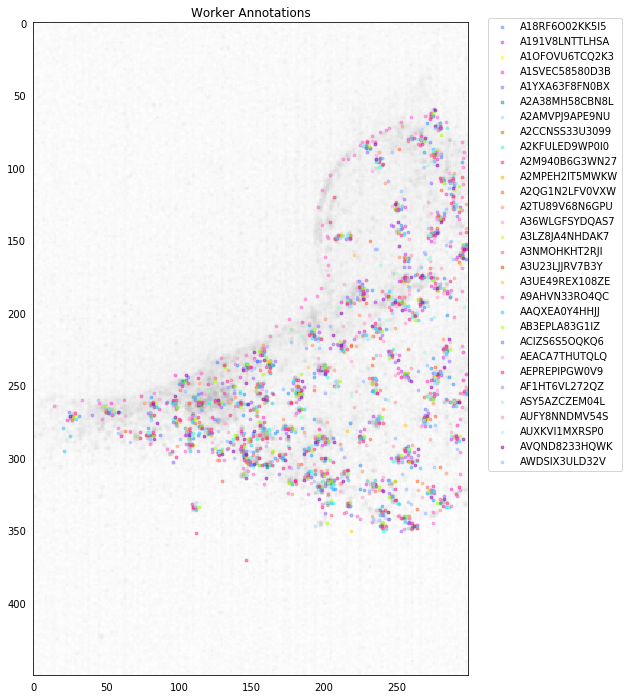

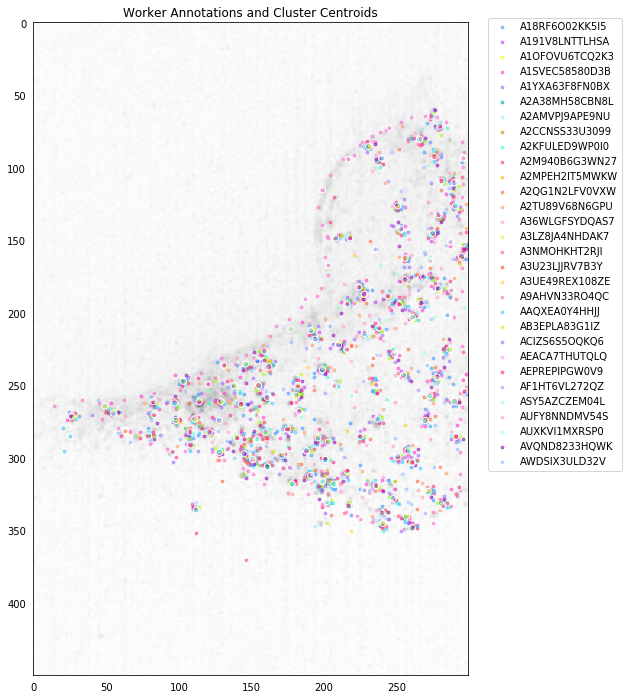

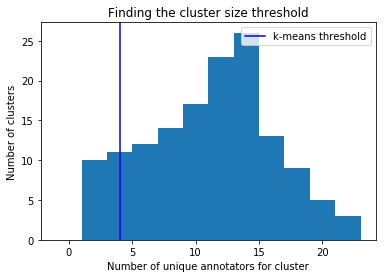

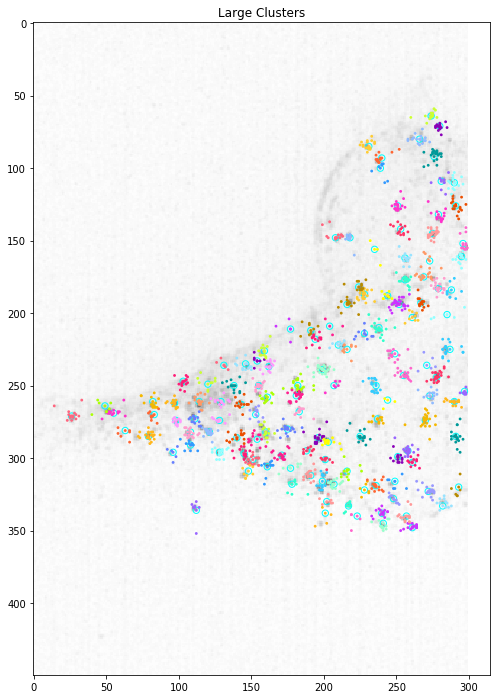

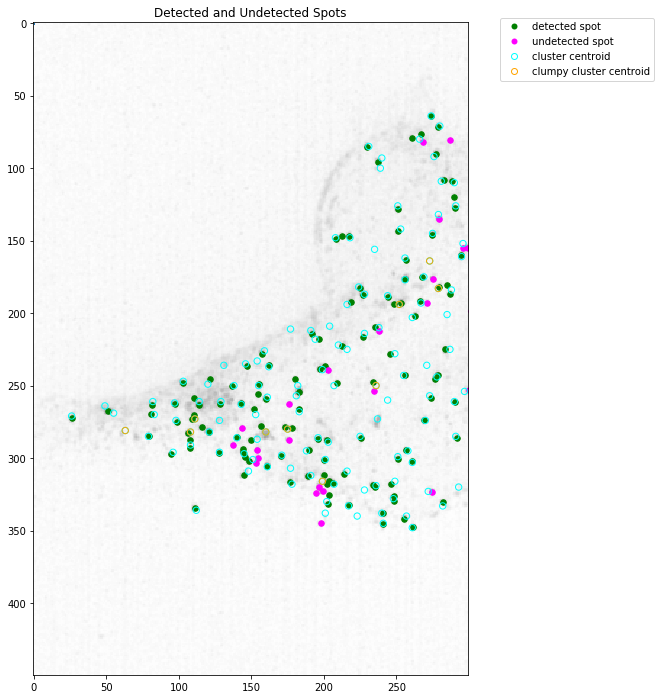

------------- C2-ISP_293T_TFRC_InSituPrep_20180712_1_MMStack_Pos0_500_inv.png -------------


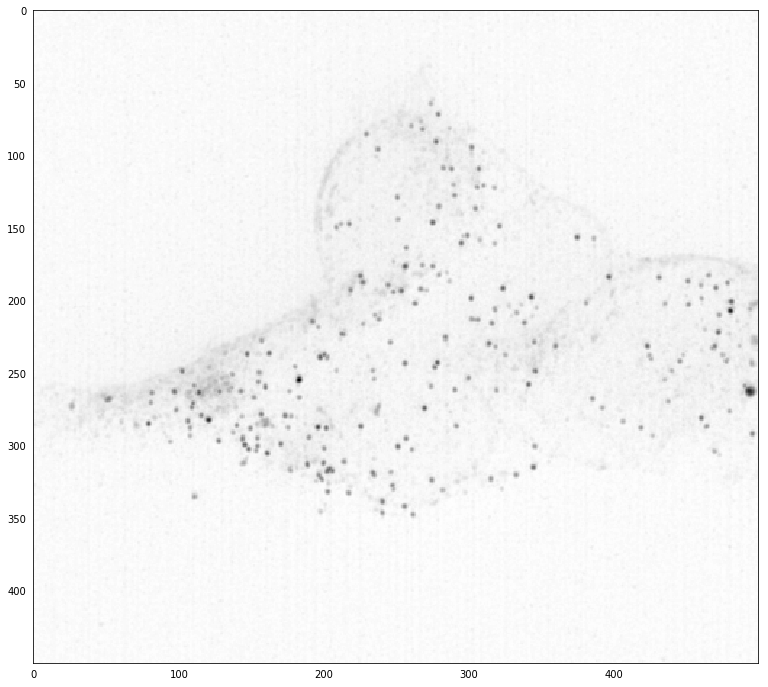

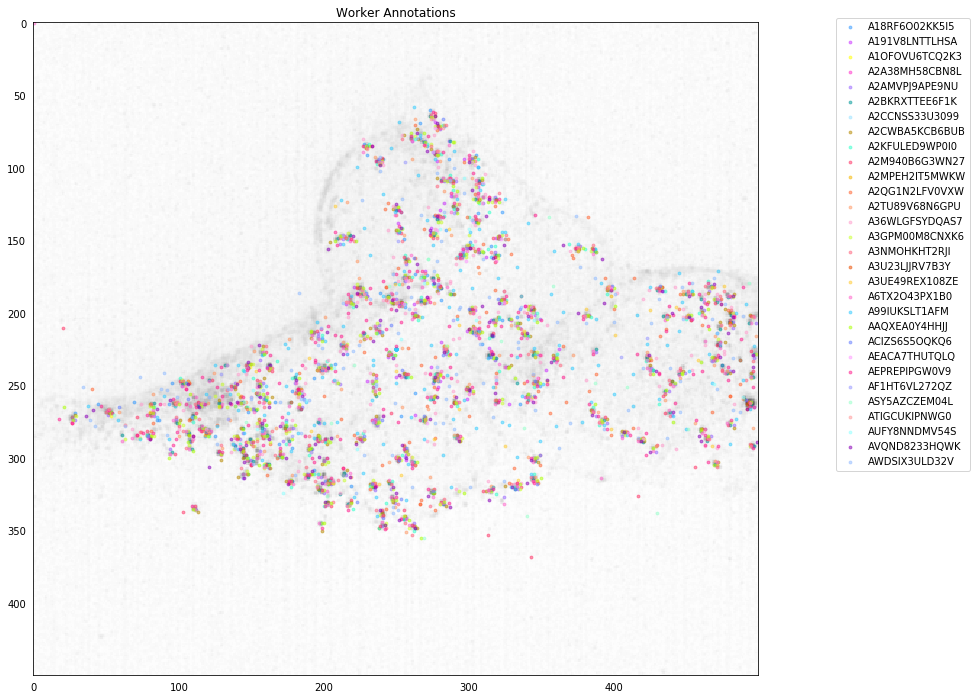

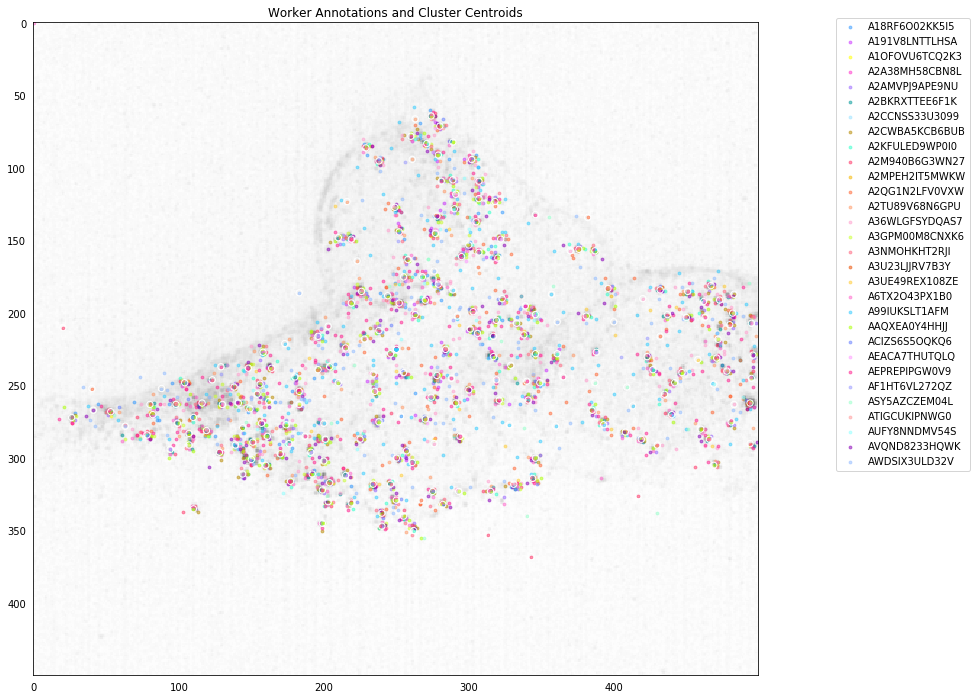

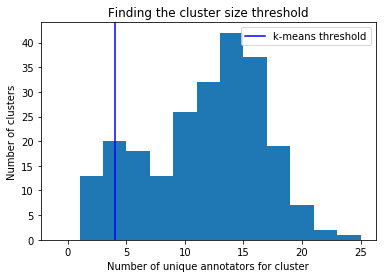

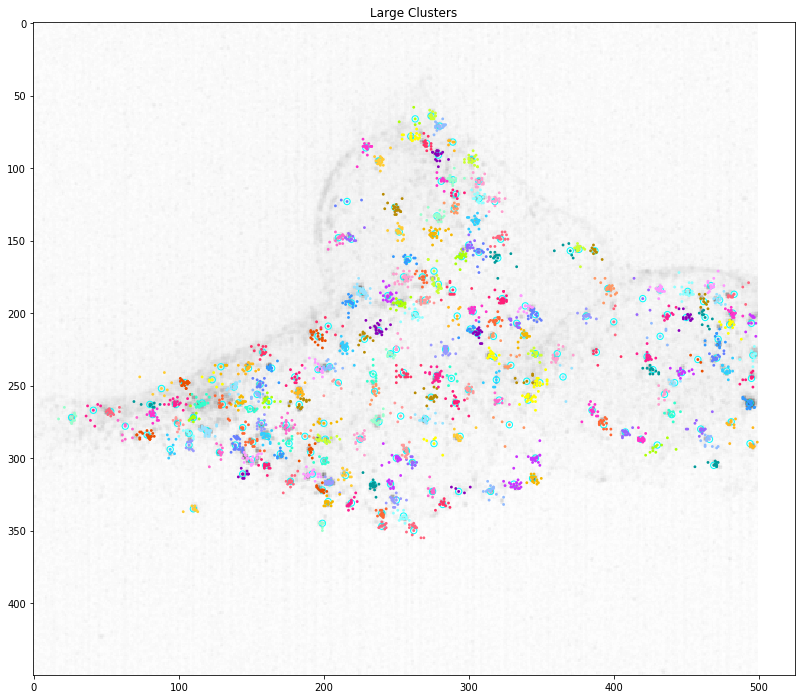

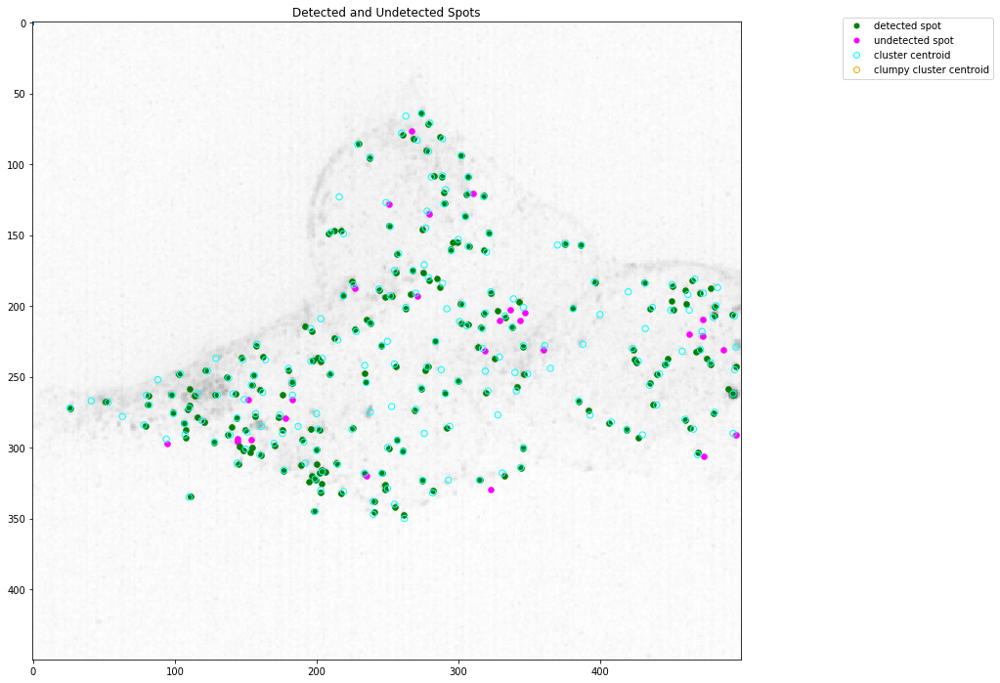

------------- C2-ISP_293T_TFRC_InSituPrep_20180712_1_MMStack_Pos0_700_inv.png -------------


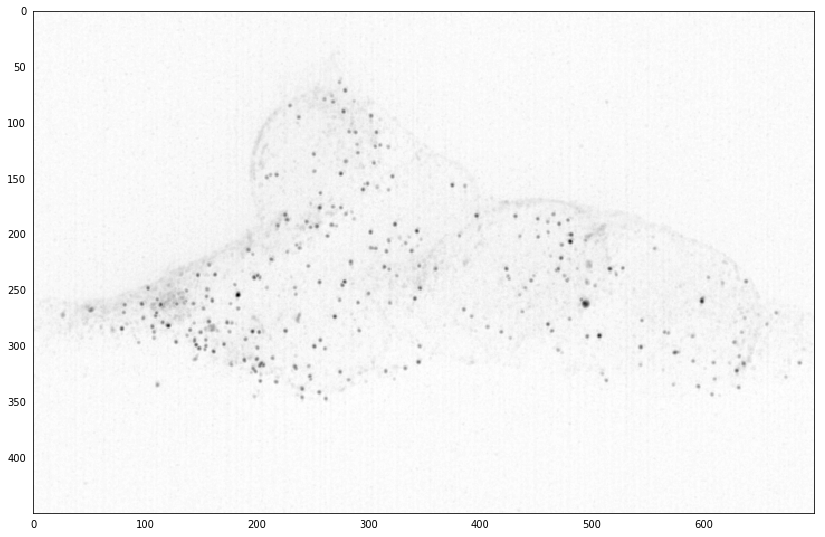

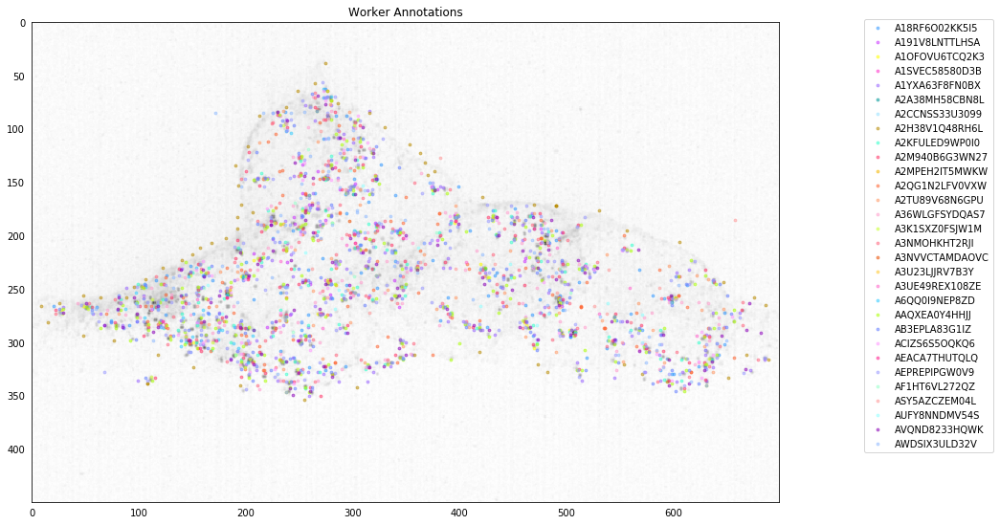

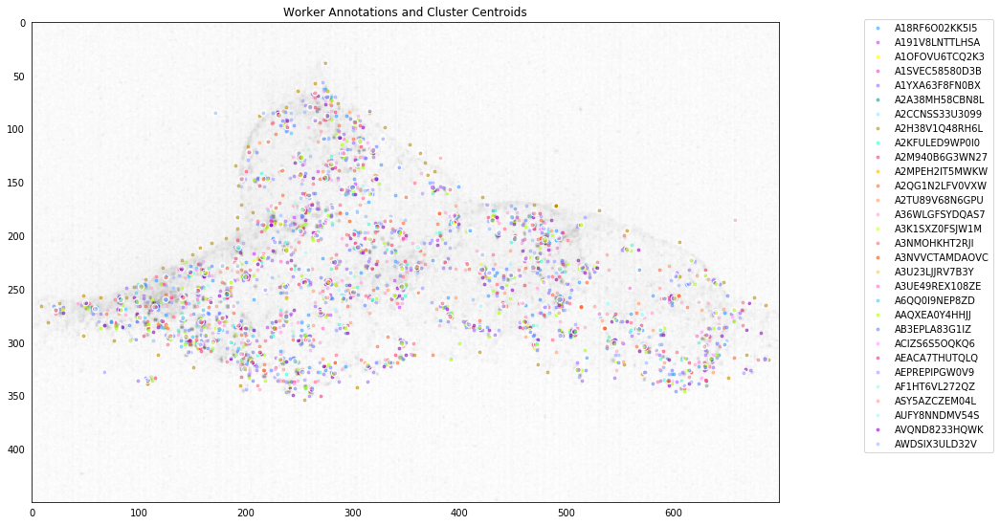

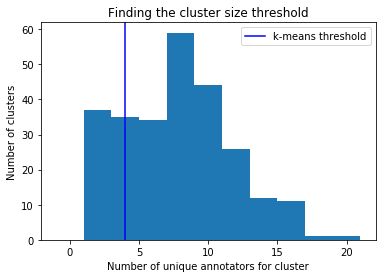

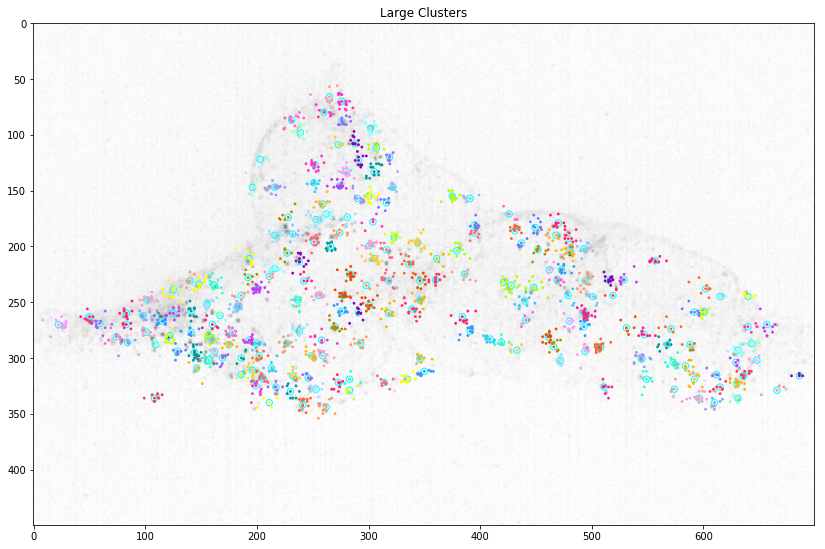

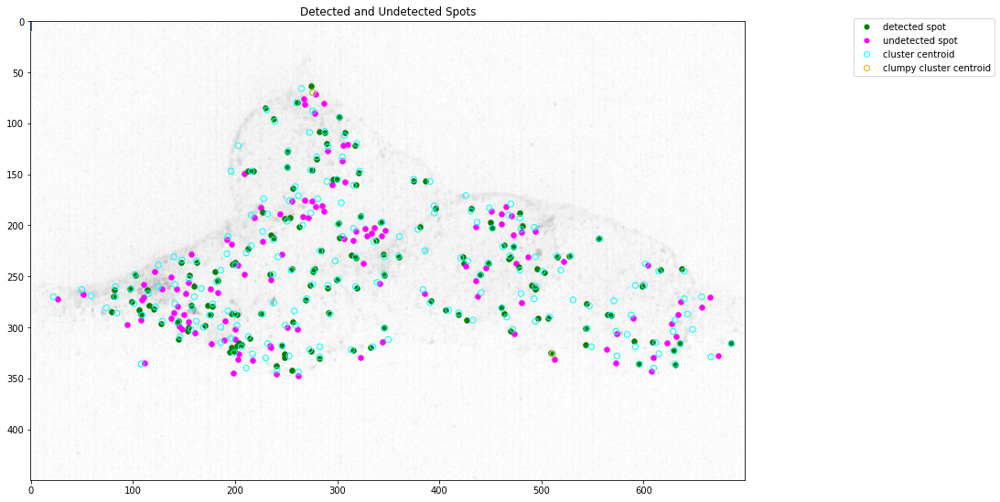

------------------------------------------------
C2-ISP_293T_TFRC_InSituPrep_20180712_1_MMStack_Pos0_300.png
Detection rate = 127 / 145 = 0.88
Avg annotations per spot = 1703 / 145 = 11.74
Avg annotations per detected spot = 1703 / 127 = 13.41
------------------------------------------------
C2-ISP_293T_TFRC_InSituPrep_20180712_1_MMStack_Pos0_500.png
Detection rate = 173 / 230 = 0.75
Avg annotations per spot = 2563 / 230 = 11.14
Avg annotations per detected spot = 2563 / 173 = 14.82
------------------------------------------------
C2-ISP_293T_TFRC_InSituPrep_20180712_1_MMStack_Pos0_700.png
Detection rate = 124 / 268 = 0.46
Avg annotations per spot = 1819 / 268 = 6.79
Avg annotations per detected spot = 1819 / 124 = 14.67
------------------------------------------------
C2-ISP_293T_TFRC_InSituPrep_20180712_1_MMStack_Pos0_300_inv.png
Detection rate = 124 / 145 = 0.86
Avg annotations per spot = 1768 / 145 = 12.19
Avg annotations per detected spot = 1768 / 124 = 14.26
---------------------

In [3]:
json_filename_list = ['smFISH_cells.json','smFISH_cells_inv.json']
width_list = [300, 500, 700]

# json_filename_list = ['smFISH_cells.json']
# width_list = [300]

img_filename_list = []
num_clicks_list = []
ref_points_list = []
ref_points_detected_list = [] 

for json_filename in json_filename_list:
    for width in width_list:
        
        img_name = 'C2-ISP_293T_TFRC_InSituPrep_20180712_1_MMStack_Pos0'
        if (json_filename == 'smFISH_cells.json'):
            img_filename = img_name+'_'+str(width)+'.png'
        else:
            img_filename = img_name+'_'+str(width)+'_inv.png'
        img_filepath = '/Users/jenny.vo-phamhi/Documents/FISH-annotation/Annotation/smFISH_test/'+img_filename
        json_filepath = '/Users/jenny.vo-phamhi/Documents/FISH-annotation/Annotation/smFISH_test/'+json_filename

        print('------------- ' + img_filename + ' -------------')
        
        ba = QuantiusAnnotation(json_filepath)
        sa = SpotAnnotationAnalysis(ba)
        anno_all = ba.df()
        anno_one_image = ba.slice_by_image(anno_all, img_filename)
        show_workers = False
        show_clusters = False
        clustering_params = None
        sa.plot_annotations(anno_one_image, img_filename, img_filepath, csv_filepath, worker_marker_size, cluster_marker_size, show_ref_points, show_workers, show_clusters, show_correctness_workers, show_correctness_clusters, show_NN_inc, correctness_threshold, clustering_params, bigger_window_size)
        
        show_workers = True
        show_correctness_workers = False
        show_correctness_clusters = False
        sa.plot_annotations(anno_one_image, img_filename, img_filepath, csv_filepath, worker_marker_size, cluster_marker_size, show_ref_points, show_workers, show_clusters, show_correctness_workers, show_correctness_clusters, show_NN_inc, correctness_threshold, clustering_params, bigger_window_size)
        
        show_clusters = True
        clustering_params = ['AffinityPropagation', -350]
        clusters = sa.plot_annotations(anno_one_image, img_filename, img_filepath, csv_filepath, worker_marker_size, cluster_marker_size, show_ref_points, show_workers, show_clusters, show_correctness_workers, show_correctness_clusters, show_NN_inc, correctness_threshold, clustering_params, bigger_window_size)

        # Get large clusters
        threshold = 4
        small_clusters, large_clusters = sa.sort_clusters_by_size(clusters, threshold)
        
        # Show cluster size threshold
        fig = plt.figure()
        hist_list = []
        for i in range(len(clusters.index)):
            row = clusters.iloc[[i]]
            members = row.iloc[0]['members']
            worker_list = []
            for member in members:
                worker_list.append(member[3])
            num_members = len(np.unique(worker_list))
            hist_list.append(num_members)
        plt.hist(hist_list, bins=np.arange(0,max(hist_list)+4,2)-1)
        plt.axvline(x=threshold, color='b')
        kmeans_line = Line2D([0],[0], color='b', label='k-means threshold')
        plt.legend(handles=[kmeans_line])
        plt.xlabel('Number of unique annotators for cluster')
        plt.ylabel('Number of clusters')
        plt.title('Finding the cluster size threshold')
        plt.show()
        
        # plot centroids and annotations of large clusters
        fig = plt.figure(figsize=(14,12))
        
        centroid_x_list = large_clusters['centroid_x'].values
        centroid_y_list = large_clusters['centroid_y'].values
        centroid_y_list_flipped = ba.flip(centroid_y_list, img_height)
        plt.scatter(centroid_x_list, centroid_y_list_flipped, s = cluster_marker_size, facecolors = 'none', edgecolors = 'cyan')
        
        img = mpimg.imread(img_filepath)
        plt.imshow(img, cmap = 'gray')
        
        member_lists = large_clusters['members'].values
        for color, member_list in zip(sa.colors*10, member_lists):
            for member in member_list:
                plt.scatter([member[0]], [img_height - member[1]], s = worker_marker_size, facecolors = color, edgecolors = 'None')
        plt.title('Large Clusters')
        plt.show()

        # visualize coverage
        
        fig = plt.figure(figsize=(14,12)) 

        centroids_coords = large_clusters.loc[:,['centroid_x', 'centroid_y']].as_matrix()
        centroids_kdt = KDTree(centroids_coords, leaf_size=2, metric='euclidean')
        ref_points_detected = 0
        num_ref_points = 0
        for ref_point in ref_points:
            dist, ind = centroids_kdt.query([ref_point], k=1)
            if (dist[0][0] <= correctness_threshold):
                color = 'green'
                ref_points_detected += 1
            else:
                color = 'magenta'
            ref_x = ref_point[0] - 2
            ref_y = 450-ref_point[1] - 2
            plt.scatter(ref_x, ref_y, c=color, s=ref_marker_size)
            if (ref_point[0] <= width):
                num_ref_points += 1
        centroids_y = [450-y for y in centroids_coords[:,1]]
        plt.scatter(centroids_coords[:,0], centroids_y, edgecolor='cyan', facecolor='None', s=cluster_marker_size)
        
        
        clumpiness_threshold = sa.get_clumpiness_threshold(large_clusters, bin_size=0.1, cutoff_fraction=3)
        clumpy_clusters, nonclumpy_clusters = sa.sort_clusters_by_clumpiness(large_clusters, clumpiness_threshold)
        clump_coords = clumpy_clusters.loc[:,['centroid_x', 'centroid_y']].as_matrix()
        clump_y = [450-y for y in clump_coords[:,1]]
        plt.scatter(clump_coords[:,0], clump_y, edgecolor='orange', facecolor='None', s=cluster_marker_size)
        
        leg_elem_1 = Line2D([0], [0], marker='o', color = 'None', markeredgecolor='None', markerfacecolor='green', label='detected spot')
        leg_elem_2 = Line2D([0], [0], marker='o', color = 'None', markeredgecolor='None', markerfacecolor='magenta', label='undetected spot')
        leg_elem_3 = Line2D([0], [0], marker='o', color = 'None', markeredgecolor='cyan', markerfacecolor='None', label='cluster centroid')
        leg_elem_4 = Line2D([0], [0], marker='o', color = 'None', markeredgecolor='orange', markerfacecolor='None', label='clumpy cluster centroid')
        plt.legend(handles = [leg_elem_1, leg_elem_2, leg_elem_3, leg_elem_4], loc = 9, bbox_to_anchor = (1.25, 1.015))
        
        img = mpimg.imread(img_filepath)
        plt.imshow(img, cmap = 'gray')
        plt.title('Detected and Undetected Spots')
        
        plt.show()
        
        num_clicks = len(ba.get_click_properties(anno_one_image))
        
        img_filename_list.append(img_filename)
        num_clicks_list.append(num_clicks)
        ref_points_list.append(num_ref_points)
        ref_points_detected_list.append(ref_points_detected)        
        
for img_filename, num_clicks, ref_points, ref_points_detected in zip(img_filename_list, num_clicks_list, ref_points_list, ref_points_detected_list):
    print('------------------------------------------------')
    print(img_filename)
    print('Detection rate = ' + str(ref_points_detected) + ' / ' + str(ref_points) + ' = ' + str(round(ref_points_detected/ref_points,2)))
    print('Avg annotations per spot = ' + str(num_clicks) + ' / ' + str(ref_points) + ' = ' + str(round(num_clicks/ref_points,2)))
    print('Avg annotations per detected spot = ' + str(num_clicks) + ' / ' + str(ref_points_detected) + ' = ' + str(round(num_clicks/ref_points_detected,2)))
        